In [1]:
import os
import random
import numpy as np
import torch
import torch.nn.functional as F
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
from ultralytics import YOLO    
from pprint import pprint

from torchvision.transforms import ToPILImage
from pathlib import Path

import gc
from tqdm import trange
import torchvision.transforms.functional as TF
# device & reproducibility
device = "cuda" if torch.cuda.is_available() else "cpu"
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

print("device:", device)
print("ultralytics version:", YOLO.__module__.split('.')[0])


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/home/shri/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
device: cuda
ultralytics version: ultralytics


In [2]:
print("CUDA available:", torch.cuda.is_available())
print("Device count:", torch.cuda.device_count())
print("Current device index:", torch.cuda.current_device())
print("Device name:", torch.cuda.get_device_name(0))


CUDA available: True
Device count: 1
Current device index: 0
Device name: NVIDIA GeForce RTX 2060


{'data_root': 'datasets/carparts-seg', 'output_dir': 'outputs', 'patch_dir': 'outputs/patches', 'device': 'cuda', 'patch_size': 256, 'lr': 0.08, 'steps': 2000, 'batch_size': 1, 'eot_samples': 4, 'save_interval': 200, 'car_class_id': 2, 'min_car_area_pct': 30.0}
Found 3833 images under datasets/carparts-seg


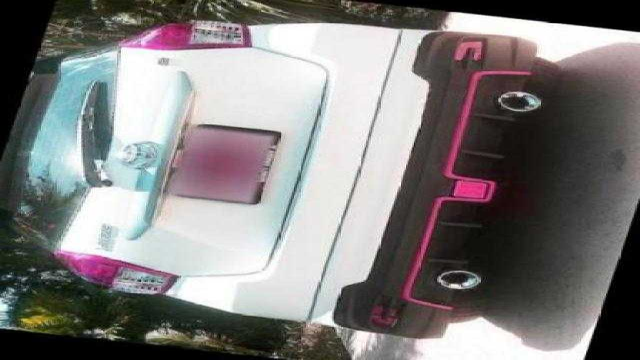

In [3]:



DATA_ROOT = Path("datasets/carparts-seg")  # CORRECT PATH: datasets/carparts-seg
OUTPUT_DIR = Path("outputs")
PATCH_DIR = OUTPUT_DIR / "patches"
PATCH_DIR.mkdir(parents=True, exist_ok=True)
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# --- Training / patch hyperparams ---
CONFIG = {
    "data_root": str(DATA_ROOT),
    "output_dir": str(OUTPUT_DIR),
    "patch_dir": str(PATCH_DIR),
    "device": device,
    "patch_size": 256,        # trainable patch resolution
    "lr": 0.08,
    "steps": 2000,           # total optimization steps (you can increase later)
    "batch_size": 1,         # images per gradient step
    "eot_samples": 4,        # transforms per image per step
    "save_interval": 200,    # save intermediate patch every N steps
    "car_class_id": 2,       # COCO id for 'car' is 2
    "min_car_area_pct": 30.0,  # Only target cars covering >30% of image
}

print(CONFIG)

# --- small helper: list some images if dataset exists ---
image_paths = sorted(Path(CONFIG["data_root"]).glob("**/*.jpg")) + sorted(Path(CONFIG["data_root"]).glob("**/*.png"))
print(f"Found {len(image_paths)} images under {CONFIG['data_root']}")
if len(image_paths) > 0:
    display(Image.open(image_paths[0]).resize((640,360)))
else:
    print("No images found — confirm DATA_ROOT path.")


In [4]:
# We use YOLOv8n (nano) as the surrogate model to generate gradients quickly.
# It’s lightweight, pretrained on COCO, and already knows the 'car' class.

model = YOLO("yolov8n.pt")  # pretrained COCO weights
model.to(device)
model.eval()  # inference mode

print("Model loaded:", model.model.__class__.__name__)
print("Model device:", next(model.model.parameters()).device)

# Quick sanity test: run one image through it (no training yet)
if len(image_paths) > 0:
    test_img = image_paths[0]
    print(f"Running a quick detection test on {test_img.name} ...")
    results = model.predict(source=str(test_img), conf=0.25, verbose=False)
    results[0].show()
else:
    print("No image found for test — skipping quick inference check.")


Model loaded: DetectionModel
Model device: cuda:0
Running a quick detection test on car25_jpg.rf.a2a62c4f3c8af7837e5ee62d1b806750.jpg ...


/snap/core20/current/lib/x86_64-linux-gnu/libstdc++.so.6: version `GLIBCXX_3.4.29' not found (required by /lib/x86_64-linux-gnu/libproxy.so.1)
Failed to load module: /home/shri/snap/code/common/.cache/gio-modules/libgiolibproxy.so
eog: symbol lookup error: /snap/core20/current/lib/x86_64-linux-gnu/libpthread.so.0: undefined symbol: __libc_pthread_init, version GLIBC_PRIVATE


In [7]:
patch_param

tensor([[[[ 0.1391, -0.1082, -0.7174,  ..., -0.2914, -0.9838, -0.6389],
          [-1.1773,  0.7465, -1.1207,  ..., -0.6762, -0.6750, -0.3841],
          [ 0.5399, -0.4145,  1.6935,  ..., -1.1631, -0.8902,  1.1785],
          ...,
          [ 0.7582,  0.7859, -0.3175,  ...,  0.0733, -0.3057, -1.1758],
          [-1.7034,  2.4890,  0.6529,  ...,  0.3805,  1.2901,  0.8301],
          [-0.5768, -0.4560, -1.3595,  ..., -0.2544,  0.7497, -1.1762]],

         [[ 0.9653,  0.0563, -0.7451,  ..., -1.0988, -1.4300, -1.2449],
          [-2.6554,  2.0740, -0.3739,  ...,  1.0181,  2.7617,  0.3105],
          [-1.2582, -0.0541,  0.8424,  ..., -0.4544, -0.6624, -0.8282],
          ...,
          [ 1.8665, -1.0698,  1.5389,  ..., -0.6575,  2.1452, -0.1617],
          [ 0.2552,  0.6436, -2.3530,  ...,  1.2879,  0.9775,  0.4599],
          [ 2.3760, -0.3039, -0.1513,  ..., -0.2458,  1.1720, -3.0468]],

         [[ 1.3910, -0.7571,  0.9525,  ...,  0.9342,  1.8508,  0.4008],
          [-1.0765, -0.4623, -

PyTorch image format: (N, C, H, W) which is same a param format.

### What Total Variation (TV) loss is

**Total Variation loss measures how smooth an image is.**
It penalizes large changes between neighboring pixels.

* Low TV loss → smooth image
* High TV loss → noisy or highly textured image

This is why TV loss is widely used in:

* adversarial patch optimization
* image denoising
* style transfer
* texture regularization

---

### Step-by-step explanation of the code

```python
def tv_loss(x):
```

`x` is an image tensor of shape:

* `(C, H, W)` **or**
* `(N, C, H, W)`

---

```python
if x.dim() == 3: 
    x = x.unsqueeze(0)
```

If a single image `(C, H, W)` is passed, it is converted to batch format `(1, C, H, W)`.

---

```python
dh = torch.abs(x[:, :, 1:, :] - x[:, :, :-1, :]).mean()
```

This computes **vertical differences**:

* subtracts each pixel from the one **above it**
* takes absolute value
* averages over all pixels and channels

Mathematically:
[
\text{dh} = \frac{1}{N}\sum |x_{i,j+1} - x_{i,j}|
]

---

```python
dw = torch.abs(x[:, :, :, 1:] - x[:, :, :, :-1]).mean()
```

This computes **horizontal differences**:

* subtracts each pixel from the one **to the left**
* takes absolute value
* averages over all pixels and channels

Mathematically:
$\text{dw} = \frac{1}{N}\sum |x_{i+1,j} - x_{i,j}|$

---

```python
return dh + dw
```

Adds both directions to get the final TV loss.

---

### The underlying formula

This code implements the **anisotropic total variation**:
$$
TV(x) =
\sum_{i,j}
\left(
|x_{i+1,j} - x_{i,j}| +
|x_{i,j+1} - x_{i,j}|
\right)
$$




(Here it’s averaged instead of summed.)

---

### Why this is used in adversarial patches

In adversarial patch training:

* The attack loss pushes the patch to fool the model
* **TV loss prevents the patch from becoming high-frequency noise**

So the total objective often looks like:
$$
\mathcal{L} = \mathcal{L}_{attack} + \lambda \cdot TV(patch)
$$

---

### Intuition

Think of TV loss as saying:

> “Don’t let neighboring pixels be wildly different.”

### 1. Isotropic vs Anisotropic TV

**Anisotropic TV** (used in your code):

$$
TV_{aniso}(x) = \sum_{i,j} \big(|x_{i+1,j} - x_{i,j}| + |x_{i,j+1} - x_{i,j}|\big)
$$

- Treats horizontal and vertical directions separately  
- Produces blocky but sharp edges  
- Cheaper and stable in optimization  

**Isotropic TV**:

$$
TV_{iso}(x) = \sum_{i,j} \sqrt{(x_{i+1,j} - x_{i,j})^2 + (x_{i,j+1} - x_{i,j})^2}
$$

- Penalizes gradient magnitude  
- Produces smoother transitions  
- Slightly harder to optimize  

---

### 2. How TV affects gradient flow

- Penalizes high-frequency noise  
- Encourages piecewise smooth regions  
- Large pixel jumps → large gradients  
- Smooth regions → near-zero gradients  

Effect in adversarial patches:  
> Attack loss pushes patch to fool detector  
> TV loss keeps patch smooth → structured patterns  

---

### 3. Why `abs()` is used instead of square

**L1 norm (absolute value)**:

$$
|x_{i+1,j} - x_{i,j}|
$$

- Preserves edges  
- Allows sharp but clean transitions  
- Robust to outliers  

**L2 norm (squared difference)**:

$$
(x_{i+1,j} - x_{i,j})^2
$$

- Over-penalizes large differences  
- Pushes image toward over-smoothed/blurred patches  

---

### 4. `.mean()` vs `.sum()`

- `.sum()` → scales with image size, larger patches → larger penalty  
- `.mean()` → size-invariant, stable across patch resolutions  

**Intuition:** TV loss says:  
> “You can change the image, but don’t make neighboring pixels wildly different.”



In [8]:


patch_size = CONFIG["patch_size"]   # keep 256 as you preferred
patch_param = torch.randn(1, 3, patch_size, patch_size, device=device, requires_grad=True)

# Higher LR for faster convergence
optimizer = torch.optim.Adam([patch_param], lr=0.05)

# Total-variation regularizer
def tv_loss(x):
    if x.dim() == 3: x = x.unsqueeze(0)
    dh = torch.abs(x[:, :, 1:, :] - x[:, :, :-1, :]).mean()
    dw = torch.abs(x[:, :, :, 1:] - x[:, :, :, :-1]).mean()
    return dh + dw

to_pil = ToPILImage()
def save_patch(param, path):
    with torch.no_grad():
        img = torch.sigmoid(param).squeeze().cpu()
        to_pil(img.clamp(0, 1)).save(path)

save_patch(patch_param, Path(CONFIG["patch_dir"]) / "patch_init.png")
print("Initialized patch param:", patch_param.shape)


Initialized patch param: torch.Size([1, 3, 256, 256])


This function is about applying a “patch” (like an image sticker) to a batch of images with some randomness, which is often called EOT (Expectation Over Transformation) in adversarial attack research.

In [9]:
import torchvision.transforms.functional as TF
import torch.nn.functional as F
import torchvision.transforms as T
import random

# Creates a Gaussian blur with a kernel size of 3. This will slightly smooth images later to make the patch blend in.
blur = T.GaussianBlur(3)

def apply_patch_eot(imgs, patch, scale_range=(0.25, 0.45), rot_range=(-10, 10)):
    """Apply patch with random scale/rotation + jitter/blur.
    imgs: a batch of images, shape [B, C, H, W] (Batch, Channels, Height, Width)
    patch: the patch you want to apply, shape [1, C, ph, pw]
    scale_range: random size multiplier for the patch
    rot_range: random rotation in degrees
    """
    
    # Makes a copy so the original batch isn’t modified.
    patched_imgs = imgs.clone()
    B, _, H, W = patched_imgs.shape
    ph, pw = patch.shape[2:]
    
    # Loop over each image in the batch
    for i in range(B):
        # Pick a random scale and random rotation for this instance of the patch.
        scale = random.uniform(*scale_range)
        angle = random.uniform(*rot_range)
        
        # F.interpolate resizes the patch according to the random scale.
        # TF.rotate rotates it by angle.
        # .squeeze(0) and .unsqueeze(0) are used because TF.rotate expects a single image [C,H,W], not a batch [1,C,H,W]
        # expand=True allows the output patch to grow in size if rotated.
        new_h, new_w = int(ph * scale), int(pw * scale)
        patch_resized = F.interpolate(patch, size=(new_h, new_w), mode="bilinear", align_corners=False)
        patch_rot = TF.rotate(
            patch_resized.squeeze(0), angle,
            interpolation=TF.InterpolationMode.BILINEAR, expand=True
        ).unsqueeze(0)
        
        # Picks a random (x, y) location inside the image where the patch can fit.
        # Directly overwrites that region in the image with the patch.
        y = random.randint(0, max(0, H - patch_rot.shape[2]))
        x = random.randint(0, max(0, W - patch_rot.shape[3]))
        patched_imgs[i, :, y:y+patch_rot.shape[2], x:x+patch_rot.shape[3]] = patch_rot[0]

    # Adds small random noise to the whole image for variation.
    # torch.clamp ensures pixel values stay between 0 and 1.
    jitter = (torch.rand_like(patched_imgs) - 0.5) * 0.2
    patched_imgs = torch.clamp(patched_imgs + jitter, 0, 1)
    
    # Appl Blur: Smooths the patch slightly so it blends better with the image.
    for i in range(B):
        patched_imgs[i] = blur(patched_imgs[i])
    return patched_imgs

print("Enhanced EOT placement ready.")


Enhanced EOT placement ready.


In [10]:
STEPS = 8000
BATCH_SIZE = 8              # Higher batch for better gradients
IMG_SIZE = 640
LR = 0.05                   # Higher LR for faster convergence
EOT_SAMPLES = 12            # More transformations
TV_WEIGHT = 0.003           # Lower TV = more complex patterns
PERCEPTUAL_WEIGHT = 0.5     # Natural-looking patches
SAVE_EVERY = 200
PATCH_SIZE = CONFIG["patch_size"]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"🔥 STATE-OF-THE-ART Training - Using {device}")
print(f"📊 Config: Steps={STEPS}, Batch={BATCH_SIZE}, EOT={EOT_SAMPLES}, LR={LR}\n")

# ---------------- HIGH-VARIANCE Random Initialization ----------------
# Research shows random noise works better than structured patterns
patch_param = torch.randn(1, 3, PATCH_SIZE, PATCH_SIZE, device=device) * 3.0  # High variance!
patch_param.requires_grad = True

print(f"Patch init variance: {patch_param.std().item():.4f} (target: > 0.5)")

# AdamW optimizer with weight decay
optimizer = torch.optim.AdamW([patch_param], lr=LR, betas=(0.9, 0.999), weight_decay=0.01)
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=1000, T_mult=2)

🔥 STATE-OF-THE-ART Training - Using cuda
📊 Config: Steps=8000, Batch=8, EOT=12, LR=0.05

Patch init variance: 3.0004 (target: > 0.5)


In [11]:
# ---------------- Augmentation with EOT ----------------
def apply_patch_eot(img, patch, min_scale=0.15, max_scale=0.40):
    """Expectation Over Transformation - robust to viewpoint changes"""
    B, C, H, W = img.shape
    ph, pw = patch.shape[2], patch.shape[3]
    
    # Random scale
    scale = random.uniform(min_scale, max_scale)
    new_h, new_w = int(ph * scale), int(pw * scale)
    new_h, new_w = max(20, new_h), max(20, new_w)
    
    patch_resized = F.interpolate(patch, size=(new_h, new_w), mode='bilinear', align_corners=False)
    
    # Aggressive rotation
    angle = random.uniform(-45, 45)
    patch_rot = TF.rotate(patch_resized.squeeze(0), angle, 
                          interpolation=TF.InterpolationMode.BILINEAR).unsqueeze(0)
    
    # Ensure fits
    rh, rw = patch_rot.shape[2], patch_rot.shape[3]
    if rh > H - 10 or rw > W - 10:
        new_size = (min(H - 10, rh), min(W - 10, rw))
        patch_rot = F.interpolate(patch_rot, size=new_size, mode='bilinear', align_corners=False)
        rh, rw = patch_rot.shape[2], patch_rot.shape[3]
    
    # Random position
    cy = random.randint(0, max(0, H - rh))
    cx = random.randint(0, max(0, W - rw))
    
    out = img.clone()
    out[:, :, cy:cy+rh, cx:cx+rw] = patch_rot[0]
    
    # Color augmentation
    brightness = random.uniform(0.6, 1.4)
    contrast = random.uniform(0.6, 1.4)
    out = torch.clamp(out * contrast + (brightness - 1.0) * 0.2, 0, 1)
    
    # Gaussian noise for robustness
    if random.random() > 0.5:
        noise = torch.randn_like(out) * 0.03
        out = torch.clamp(out + noise, 0, 1)
    
    return out


# Comparison of Two EOT Patch Application Functions

Both functions implement **Expectation Over Transformation (EOT)** for applying adversarial patches, but they differ in batch support, transformations, and augmentations.

---

### 1. Input and Batch Handling
- **Code 1:** Handles a batch of images `[B, C, H, W]`. Loops over each image.
- **Code 2:** Handles a single image `[1, C, H, W]` or `[C, H, W]`.

---

### 2. Scale
- **Code 1:** Random scale between `0.25–0.45`.  
- **Code 2:** Random scale between `0.15–0.40` with minimum patch size `20x20`.  

---

### 3. Rotation
- **Code 1:** ±10° (subtle) with `expand=True`.  
- **Code 2:** ±45° (aggressive) without expand (corners may be cropped).  

---

### 4. Positioning
- **Code 1:** Random `(x, y)` within image bounds.  
- **Code 2:** Random `(x, y)` but ensures patch fits inside the image by resizing if needed.  

---

### 5. Additional Augmentations
- **Code 1:** Adds small **jitter noise** and **Gaussian blur** for blending.  
- **Code 2:** Adds random **brightness & contrast**, optional **Gaussian noise**; no blur.  

---

### 6. Style and Interpolation
- **Code 1:** `F.interpolate` + `TF.rotate(expand=True)` preserves details when rotating.  
- **Code 2:** `F.interpolate` + `TF.rotate` without expand; adds multiplicative contrast adjustment.  

---

### 7. Practical Effect
- **Code 1:** Patch blends naturally; visually smooth.  
- **Code 2:** Patch is robust to lighting/rotation changes; more aggressive but may appear less natural.  

---

### 8. Summary Table

| Feature | Code 1 | Code 2 |
|---------|--------|--------|
| Batch support | ✅ Yes | ❌ Single image |
| Scale range | 0.25–0.45 | 0.15–0.40, min 20x20 |
| Rotation | ±10° | ±45° |
| Rotation expand | Yes | No |
| Position | Random | Random with fit check |
| Blur | ✅ Yes | ❌ No |
| Color/brightness | ❌ | ✅ contrast & brightness |
| Noise | 0.2 jitter | Gaussian 0.03 |
| Robustness focus | Blending/smoothness | Photometric & geometric |
| Complexity | Medium | Medium |

---

**Conclusion:**  
- **Code 1** → better for visually blended patches.  
- **Code 2** → better for robustness to viewpoint and lighting changes.  


This perceptual loss acts like a soft prior on realism:

Keeps patch values bounded

Encourages natural color variation

Prevents degenerate adversarial solutions (e.g., noisy or flat gray patches)

It’s lightweight compared to VGG-based perceptual losses, but very effective for adversarial patch optimization, especially in physical or EOT-based settings.

In [13]:
def tv_loss(patch):
    """Total Variation loss for smoothness"""
    dh = torch.abs(patch[:, :, 1:, :] - patch[:, :, :-1, :])
    dw = torch.abs(patch[:, :, :, 1:] - patch[:, :, :, :-1])
    return dh.mean() + dw.mean()


"""regularization (perceptual) loss for an image patch. Its goal is to keep the patch natural-looking and visually plausible,
instead of letting optimization produce extreme or unnatural patterns.

This loss is typically added to an adversarial objective so the patch:
    does not explode to extreme values
    does not collapse to a dull gray texture"""

def perceptual_loss(patch):
    """Encourage natural-looking patches (low-frequency bias)"""
    # Penalize extreme values
    """During optimization (especially adversarial patch training), pixel values can grow very large. 
    This term:
        softly constrains the patch values
        avoids high-frequency, noisy, or saturated artifacts

    Think of it as: “Don’t let the patch become numerically or visually extreme.”
    """
    extreme_penalty = torch.relu(torch.abs(patch) - 2.0).mean()
    
    # Encourage color diversity (not gray)
    # color_std measures how colorful the patch is overall.
    color_std = patch.std(dim=1).mean()
    color_penalty = torch.relu(0.3 - color_std)
    """
    If color_std ≥ 0.3 → no penalty

    If color_std < 0.3 → penalty increases

    Encourages the optimizer to avoid grayscale or washed-out patches

    Intuition
        Gray or low-color patches are:
            visually unnatural
            often less effective or suspicious in physical-world attacks
    """
    # Value regularization (no extreme pixels) + Color regularization (avoid grayscale collapse)
    return extreme_penalty + color_penalty

function is for loading a batch of images with random augmentations to introduce diversity
- Picks random images from a dataset
- Applies random crops, flips, resizing
- Converts them to normalized PyTorch tensors
- Returns a diverse batch suitable for training or testing adversarial patches

In [16]:
def load_batch(batch_size=BATCH_SIZE):
    """Load diverse batch"""
    imgs = []
    for _ in range(batch_size):
        # Picks a random image from image_paths.Converts it to RGB to ensure 3 channels.
        p = random.choice(image_paths)
        img = Image.open(p).convert("RGB")
        
        # Random crop for diversity
        w, h = img.size
        """
            50% chance to do a random crop if the image is large enough (>700px)
            crop_scale randomly selects 70–100% of the original size
            Picks a random top-left corner
            Crops the image → introduces spatial diversity for trainin
        """
        if random.random() > 0.5 and w > 700 and h > 700:
            crop_scale = random.uniform(0.7, 1.0)
            crop_w, crop_h = int(w * crop_scale), int(h * crop_scale)
            left = random.randint(0, w - crop_w)
            top = random.randint(0, h - crop_h)
            img = img.crop((left, top, left + crop_w, top + crop_h))
        
        # Resizes every image to IMG_SIZE x IMG_SIZE for batch consistency.BILINEAR → smooth interpolation.
        img = img.resize((IMG_SIZE, IMG_SIZE), Image.BILINEAR)
        
        # Random flip
        # 50% chance to flip left-to-right. Adds mirror variation (common data augmentation)
        if random.random() > 0.5:
            img = img.transpose(Image.FLIP_LEFT_RIGHT)
        
        # Convert to PyTorch tensor
        t = torch.tensor(np.array(img) / 255.0, dtype=torch.float32)
        t = t.permute(2, 0, 1).unsqueeze(0).to(device)
        imgs.append(t)
    return torch.cat(imgs, dim=0)

compute_multi_scale_loss, is designed to attack a YOLOv8 object detector at the feature level across multiple scales, which is useful in generating adversarial patches that fool the detector.

## Purpose of the function
- Goal: Generate a scalar loss that encourages YOLOv8 to mis-predict objects (especially cars) when given patched_imgs.
- Context: YOLOv8 has 3 detection heads, each producing feature maps at different scales. This function computes losses for each scale and sums them.

## Multi-scale attack: Handles 3 YOLO detection heads.
Losses:
- Reduce objectness confidence.
- Randomize/instabilize bounding boxes.
- Suppress specific class (car).

Goal: Fool YOLOv8 into failing to detect cars or generating inconsistent predictions.

## What is the goal?
This function creates a loss that helps an adversarial patch confuse YOLOv8, especially so that it:
- Does not detect objects
- Gives bad bounding boxes
- Misses cars specifically
- Works across all YOLO scales
- This loss teaches the adversarial patch to break YOLOv8 at every scale by lowering confidence, scrambling boxes, and hiding cars.

In [17]:

# ---------------- MULTI-SCALE FEATURE ATTACK ----------------
def compute_multi_scale_loss(patched_imgs):
    """
    Attack YOLO features at multiple scales
    YOLOv8 has 3 detection heads at different scales
    """
    
    # Setting the model to training mode ensures gradients are tracked for backpropagation
    # This is necessary because we’re trying to optimize the input image (the patch), not the model itself.
    model.model.train()  # Enable gradients through model
    
    with torch.set_grad_enabled(True):
        # Get raw features from model (before NMS)
        # features are the outputs of the YOLOv8 detection heads before post-processing (like NMS).
        # Typically a list of 3 feature maps, one per scale. Each map has shape [batch, channels, H, W].
        features = model.model(patched_imgs)
    
    # Initialize total loss
    total_loss = torch.tensor(0.0, device=device, requires_grad=True)
    
    # YOLOv8 returns list of feature maps from 3 scales
    # Only process valid feature maps.
    # YOLOv8 feature maps encode per-grid predictions:
    # Channels usually include [x, y, w, h, objectness, class_logits...].
    if isinstance(features, (list, tuple)):
        for scale_idx, feat in enumerate(features):
            if feat is not None and feat.numel() > 0:
                # Each feature map: [batch, channels, H, W]
                # For YOLOv8, channels encode: [x, y, w, h, objectness, ...classes]
                
                B, C, H, W = feat.shape
                
                # Reshape to [batch, H*W, channels]
                # Permute and flatten spatial dimensions: Original: [batch, channels, H, W] 
                # Flattened: [batch, H*W, channels] → easier to compute losses per predicted box.
                feat_flat = feat.permute(0, 2, 3, 1).reshape(B, -1, C)
                
                # LOSS 1: Suppress objectness/confidence
                # Assuming objectness is in channel 4 (after x,y,w,h)
                # YOLO predicts objectness in channel 4.
                # torch.sigmoid(objectness) → probability of object.
                # Squaring it encourages values to go toward 0, suppressing object detection.
                # Multiplied by 15.0 to scale the loss
                if C > 4:
                    objectness = feat_flat[:, :, 4:5]  # [B, H*W, 1]
                    obj_loss = torch.sigmoid(objectness).pow(2).mean() * 15.0
                    total_loss = total_loss + obj_loss
                
                # LOSS 2: Disrupt spatial predictions (x, y, w, h)
                # YOLO predicts bounding boxes in channels [0:4].
                # spatial.var(dim=1) computes variance across spatial positions.
                # -spatial.var() maximizes the variance, encouraging boxes to be inconsistent/extreme → makes detection unstable.
                # Multiplied by 3.0 to weight this effect.
                if C >= 4:
                    spatial = feat_flat[:, :, :4]  # [B, H*W, 4]
                    # Encourage extreme/random predictions
                    spatial_loss = -spatial.var(dim=1).mean() * 3.0
                    total_loss = total_loss + spatial_loss
                
                # LOSS 3: Suppress car class specifically
                # Car class is at position 4 (objectness) + 1 + car_class_id
                # car_class_id is the index of the car class in the model.
                # Compute sigmoid → probability of predicting a car.
                # Squaring it and averaging → encourages the network to predict low probability for cars.
                # Multiplied by 20.0 to emphasize this class-specific attac
                if C > 4 + CONFIG["car_class_id"]:
                    car_class_idx = 4 + 1 + CONFIG["car_class_id"]  # Skip x,y,w,h,obj
                    if car_class_idx < C:
                        car_logits = feat_flat[:, :, car_class_idx:car_class_idx+1]
                        car_probs = torch.sigmoid(car_logits)
                        car_loss = car_probs.pow(2).mean() * 20.0
                        total_loss = total_loss + car_loss
    
    # Fallback if structure different
    # If none of the previous losses applied (maybe feature structure is different), 
    # it minimizes absolute feature activations as a generic attack.
    if total_loss.item() == 0.0:
        # Just minimize all activations
        if isinstance(features, (list, tuple)):
            for feat in features:
                if feat is not None:
                    total_loss = total_loss + feat.abs().mean() * 5.0
        else:
            total_loss = features.abs().mean() * 5.0
    
    return total_loss

This is a full adversarial patch training loop with EOT, regularization, logging, and early stopping. I’ll explain it top‑down, then summarize the logic in one clean flow.

In [21]:

# ---------------- TRAINING LOOP WITH EARLY STOPPING ----------------
print(f"🚀 Training Started!\n")

# Setup & bookkeeping
best_loss = float('inf')
loss_history = []
detection_losses = []
patience = 1000
best_step = 0

# Each iteration = one patch update, not model update.
for step in trange(STEPS, desc="🔥 Training"):
    # Load images & prepare patch
    imgs = load_batch()
    patch_sig = torch.sigmoid(patch_param)
    
    optimizer.zero_grad()
    
    total_det_loss = 0.0
    
    # EOT: Multiple transformations
    # This is critical for physical robustness.
    # Each iteration:
    #   Applies random transformations to the patch
    #   Evaluates detection loss
    #   Accumulates loss
    for _ in range(EOT_SAMPLES):
        patched = torch.stack([
            apply_patch_eot(img.unsqueeze(0), patch_sig).squeeze(0)
            for img in imgs
        ])
        
        # Multi-scale feature attack
        det_loss = compute_multi_scale_loss(patched)
        total_det_loss += det_loss
    
    # Average over EOT
    avg_det_loss = total_det_loss / EOT_SAMPLES
    
    # Regularization
    loss_tv = TV_WEIGHT * tv_loss(patch_sig)
    loss_perceptual = PERCEPTUAL_WEIGHT * perceptual_loss(patch_param)
    
    # Total loss
    # This is a trade‑off:Strong attack, Smooth patch, Human‑plausible appearance
    total_loss = avg_det_loss + loss_tv + loss_perceptual
    
    # Backward
    total_loss.backward()
    
    # Gradient clipping
    # Prevents: Exploding gradients, Patch collapse, NaN instability
    torch.nn.utils.clip_grad_norm_([patch_param], max_norm=10.0)
    
    # Check for NaN gradients
    if patch_param.grad is not None:
        if torch.isnan(patch_param.grad).any() or torch.isinf(patch_param.grad).any():
            # Skip Update
            # This is very important for long adversarial training runs
            print(f"\n⚠️  NaN/Inf gradients at step {step}, skipping update")
            optimizer.zero_grad()
            continue
    
    # The model is frozen, only the patch learns.
    # Gradients flow: YOLO → image → patch → patch_param
    # Update
    # Patch parameters updated, Learning rate adjusted (scheduler)
    optimizer.step()
    scheduler.step()
    
    # Tracking
    loss_val = total_loss.item()
    det_loss_val = avg_det_loss.item()
    
    loss_history.append(loss_val)
    detection_losses.append(det_loss_val)
    
    # Save best Patch
    if loss_val < best_loss:
        best_loss = loss_val
        best_step = step
        best_path = Path(CONFIG["patch_dir"]) / "best_patch.png"
        with torch.no_grad():
            img_out = torch.sigmoid(patch_param).squeeze().cpu()
            patch_np = (img_out.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
            Image.fromarray(patch_np).save(best_path)
    
    # Early stopping
    if step - best_step > patience:
        print(f"\n⏹️  EARLY STOPPING at step {step}")
        print(f"   No improvement for {patience} steps")
        print(f"   Best loss: {best_loss:.5f} at step {best_step}")
        break
    
    # Periodic saves
    """
    Every SAVE_EVERY steps:

        Save patch image

        Print:

            Detection loss
            Regularization losses
            Learning rate
            Patch mean/std
            Gradient norm
            Steps since last improvement

        This is excellent experimental hygiene.
    """ 
    if step % SAVE_EVERY == 0:
        out_path = Path(CONFIG["patch_dir"]) / f"aggressive_patch_step_{step}.png"
        with torch.no_grad():
            img_out = torch.sigmoid(patch_param).squeeze().cpu()
            patch_np = (img_out.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
            Image.fromarray(patch_np).save(out_path)
        
        # Patch statistics
        patch_std = patch_sig.std().item()
        patch_mean = patch_sig.mean().item()
        
        recent_window = 100
        avg_recent = np.mean(detection_losses[-recent_window:]) if len(detection_losses) >= recent_window else det_loss_val
        
        print(f"\n🔥 Step {step}/{STEPS}")
        print(f"   Detection Loss: {det_loss_val:.5f} (avg: {avg_recent:.5f})")
        print(f"   TV Loss: {loss_tv.item():.5f}")
        print(f"   Perceptual: {loss_perceptual.item():.5f}")
        print(f"   Total: {loss_val:.5f} | Best: {best_loss:.5f} (step {best_step})")
        print(f"   LR: {optimizer.param_groups[0]['lr']:.6f}")
        print(f"   Patch stats: mean={patch_mean:.3f}, std={patch_std:.3f}")
        print(f"   Steps since improvement: {step - best_step}")
        
        # Gradient health
        if patch_param.grad is not None:
            grad_norm = patch_param.grad.norm().item()
            print(f"   Gradient norm: {grad_norm:.6f}")
    
    # Memory cleanup
    # Prevents long‑run CUDA fragmentation.
    if step % 100 == 0:
        torch.cuda.empty_cache()

print("\n" + "="*70)
print("✅ STATE-OF-THE-ART Training Complete!")
print(f"   Best patch: {best_path}")
print(f"   Best loss: {best_loss:.5f} at step {best_step}")
print(f"   Total steps: {step + 1}/{STEPS}")
print("="*70)


🚀 Training Started!



🔥 Training:   0%|          | 0/8000 [00:00<?, ?it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 38.00 MiB. GPU 0 has a total capacity of 5.79 GiB of which 39.88 MiB is free. Including non-PyTorch memory, this process has 5.74 GiB memory in use. Of the allocated memory 5.37 GiB is allocated by PyTorch, and 251.82 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

🔥 STATE-OF-THE-ART Training - Using cuda
📊 Config: Steps=8000, Batch=8, EOT=12, LR=0.05

Patch init variance: 2.9944 (target: > 0.5)
🚀 Training Started!



🔥 Training:   0%|          | 0/8000 [00:00<?, ?it/s]


🔥 Step 0/8000
   Detection Loss: 21.25595 (avg: 21.25595)
   TV Loss: 0.00252
   Perceptual: 0.45159
   Total: 21.71006 | Best: 21.71006 (step 0)
   LR: 0.050000
   Patch stats: mean=0.501, std=0.368
   Steps since improvement: 0
   Gradient norm: 0.019914


🔥 Training:   2%|▎         | 200/8000 [01:35<1:01:36,  2.11it/s]


🔥 Step 200/8000
   Detection Loss: 13.09731 (avg: 15.68868)
   TV Loss: 0.00195
   Perceptual: 0.04817
   Total: 13.14743 | Best: 1.02307 (step 43)
   LR: 0.045179
   Patch stats: mean=0.497, std=0.302
   Steps since improvement: 157
   Gradient norm: 0.026625


🔥 Training:   5%|▌         | 400/8000 [03:11<1:02:31,  2.03it/s]


🔥 Step 400/8000
   Detection Loss: 19.42190 (avg: 15.17559)
   TV Loss: 0.00160
   Perceptual: 0.02746
   Total: 19.45095 | Best: 1.02307 (step 43)
   LR: 0.032651
   Patch stats: mean=0.490, std=0.280
   Steps since improvement: 357
   Gradient norm: 0.028462


🔥 Training:   8%|▊         | 600/8000 [04:45<58:32,  2.11it/s]  


🔥 Step 600/8000
   Detection Loss: 12.97081 (avg: 13.84942)
   TV Loss: 0.00136
   Perceptual: 0.02391
   Total: 12.99608 | Best: 1.02307 (step 43)
   LR: 0.017200
   Patch stats: mean=0.483, std=0.268
   Steps since improvement: 557
   Gradient norm: 0.048177


🔥 Training:  10%|█         | 800/8000 [06:22<56:42,  2.12it/s]  


🔥 Step 800/8000
   Detection Loss: 14.54144 (avg: 13.51807)
   TV Loss: 0.00127
   Perceptual: 0.02138
   Total: 14.56409 | Best: 1.02307 (step 43)
   LR: 0.004729
   Patch stats: mean=0.480, std=0.262
   Steps since improvement: 757
   Gradient norm: 0.049359


🔥 Training:  12%|█▎        | 1000/8000 [07:58<56:29,  2.07it/s] 


🔥 Step 1000/8000
   Detection Loss: -1.26267 (avg: 13.76664)
   TV Loss: 0.00126
   Perceptual: 0.02089
   Total: -1.24053 | Best: -1.24053 (step 1000)
   LR: 0.050000
   Patch stats: mean=0.480, std=0.261
   Steps since improvement: 0
   Gradient norm: 0.050269


🔥 Training:  15%|█▌        | 1200/8000 [09:35<54:20,  2.09it/s]  


🔥 Step 1200/8000
   Detection Loss: 12.73396 (avg: 12.78792)
   TV Loss: 0.00110
   Perceptual: 0.03189
   Total: 12.76695 | Best: -1.24053 (step 1000)
   LR: 0.048764
   Patch stats: mean=0.468, std=0.269
   Steps since improvement: 200
   Gradient norm: 0.044291


🔥 Training:  18%|█▊        | 1400/8000 [11:10<52:06,  2.11it/s]  


🔥 Step 1400/8000
   Detection Loss: 13.34555 (avg: 12.03789)
   TV Loss: 0.00104
   Perceptual: 0.03722
   Total: 13.38380 | Best: -1.24053 (step 1000)
   LR: 0.045202
   Patch stats: mean=0.459, std=0.277
   Steps since improvement: 400
   Gradient norm: 0.049148


🔥 Training:  20%|██        | 1600/8000 [12:46<49:18,  2.16it/s]  


🔥 Step 1600/8000
   Detection Loss: 12.72315 (avg: 10.78685)
   TV Loss: 0.00100
   Perceptual: 0.03896
   Total: 12.76311 | Best: -1.24053 (step 1000)
   LR: 0.039663
   Patch stats: mean=0.453, std=0.279
   Steps since improvement: 600
   Gradient norm: 0.050816


🔥 Training:  22%|██▎       | 1800/8000 [14:19<48:18,  2.14it/s]


🔥 Step 1800/8000
   Detection Loss: 11.28031 (avg: 10.76278)
   TV Loss: 0.00097
   Perceptual: 0.03930
   Total: 11.32057 | Best: -1.24053 (step 1000)
   LR: 0.032688
   Patch stats: mean=0.450, std=0.279
   Steps since improvement: 800
   Gradient norm: 0.050947


🔥 Training:  25%|██▌       | 2000/8000 [15:54<47:11,  2.12it/s]  


🔥 Step 2000/8000
   Detection Loss: 7.34258 (avg: 11.19828)
   TV Loss: 0.00094
   Perceptual: 0.03850
   Total: 7.38202 | Best: -1.24053 (step 1000)
   LR: 0.024961
   Patch stats: mean=0.448, std=0.277
   Steps since improvement: 1000
   Gradient norm: 0.047621


🔥 Training:  25%|██▌       | 2001/8000 [15:55<47:45,  2.09it/s]


⏹️  EARLY STOPPING at step 2001
   No improvement for 1000 steps
   Best loss: -1.24053 at step 1000

✅ STATE-OF-THE-ART Training Complete!
   Best patch: outputs/patches/best_patch.png
   Best loss: -1.24053 at step 1000
   Total steps: 2002/8000


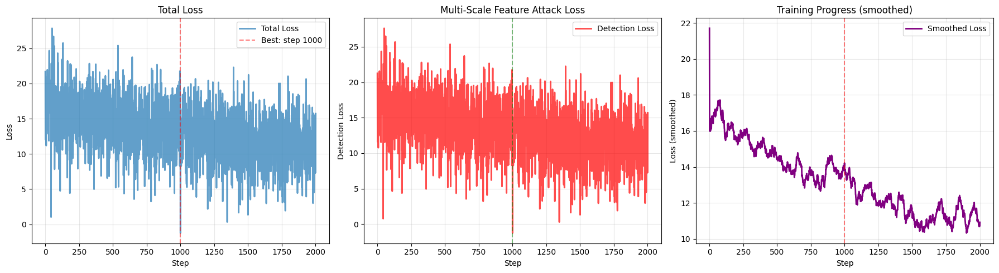

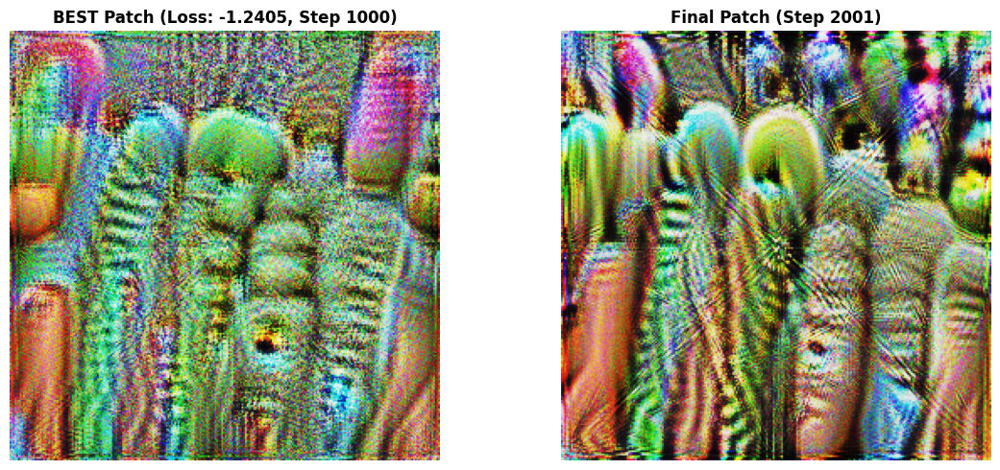


🎯 This patch should be COLORFUL and EFFECTIVE!
   If still gray, check gradient norm in training logs.


: 

In [ ]:

# Plot training curves
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(loss_history, label='Total Loss', linewidth=2, alpha=0.7)
axes[0].axvline(best_step, color='red', linestyle='--', alpha=0.5, label=f'Best: step {best_step}')
axes[0].set_xlabel('Step')
axes[0].set_ylabel('Loss')
axes[0].set_title('Total Loss')
axes[0].grid(True, alpha=0.3)
axes[0].legend()

axes[1].plot(detection_losses, label='Detection Loss', color='red', linewidth=2, alpha=0.7)
axes[1].axvline(best_step, color='green', linestyle='--', alpha=0.5)
axes[1].set_xlabel('Step')
axes[1].set_ylabel('Detection Loss')
axes[1].set_title('Multi-Scale Feature Attack Loss')
axes[1].grid(True, alpha=0.3)
axes[1].legend()

# Plot patch evolution
if len(loss_history) > 100:
    window = 50
    smoothed = [np.mean(loss_history[max(0, i-window):i+1]) for i in range(len(loss_history))]
    axes[2].plot(smoothed, label='Smoothed Loss', linewidth=2, color='purple')
    axes[2].axvline(best_step, color='red', linestyle='--', alpha=0.5)
    axes[2].set_xlabel('Step')
    axes[2].set_ylabel('Loss (smoothed)')
    axes[2].set_title('Training Progress (smoothed)')
    axes[2].grid(True, alpha=0.3)
    axes[2].legend()

plt.tight_layout()
plt.savefig(str(Path(CONFIG["output_dir"]) / "sota_training_curves.png"), dpi=150)
plt.show()

# Display patches
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
best_img = Image.open(best_path)

axes[0].imshow(best_img)
axes[0].set_title(f'BEST Patch (Loss: {best_loss:.4f}, Step {best_step})', fontweight='bold')
axes[0].axis('off')

if out_path.exists():
    final_img = Image.open(out_path)
    axes[1].imshow(final_img)
    axes[1].set_title(f'Final Patch (Step {step})', fontweight='bold')
    axes[1].axis('off')

plt.tight_layout()
plt.show()

print("\n🎯 This patch should be COLORFUL and EFFECTIVE!")
print(f"   If still gray, check gradient norm in training logs.")

✅ Loading patch from: outputs/patches/best_patch.png
✅ Model set to eval mode for proper inference



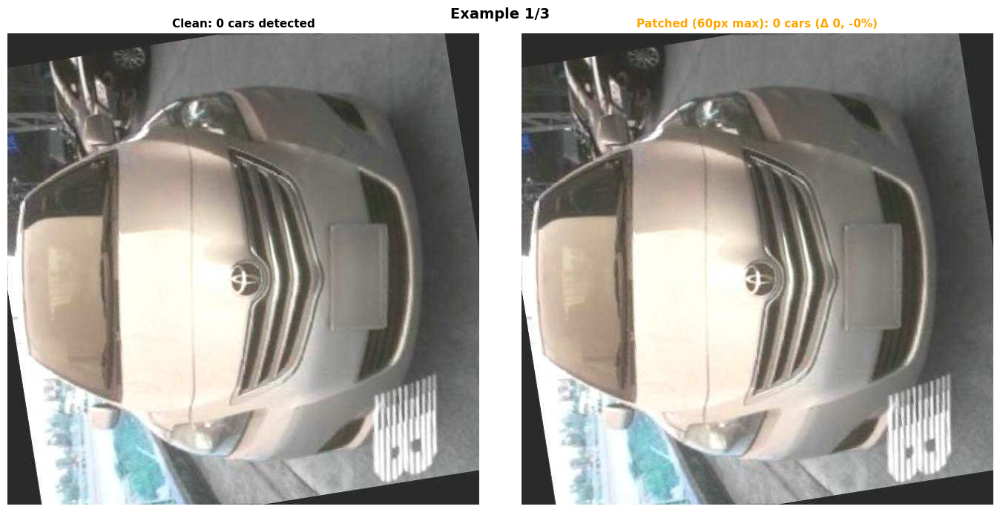

Image 1: Clean=0 → Patched=0 | Drop=0 (0.0%)


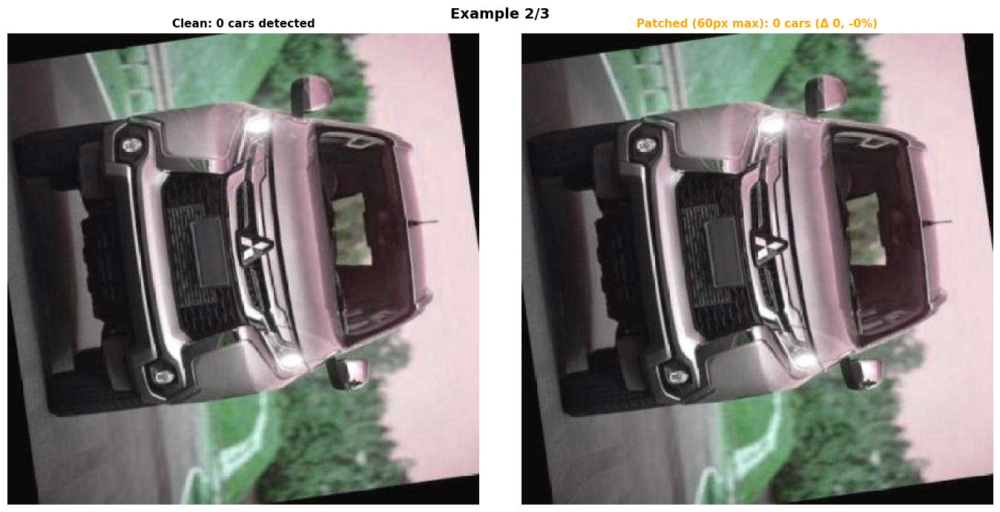

Image 2: Clean=0 → Patched=0 | Drop=0 (0.0%)


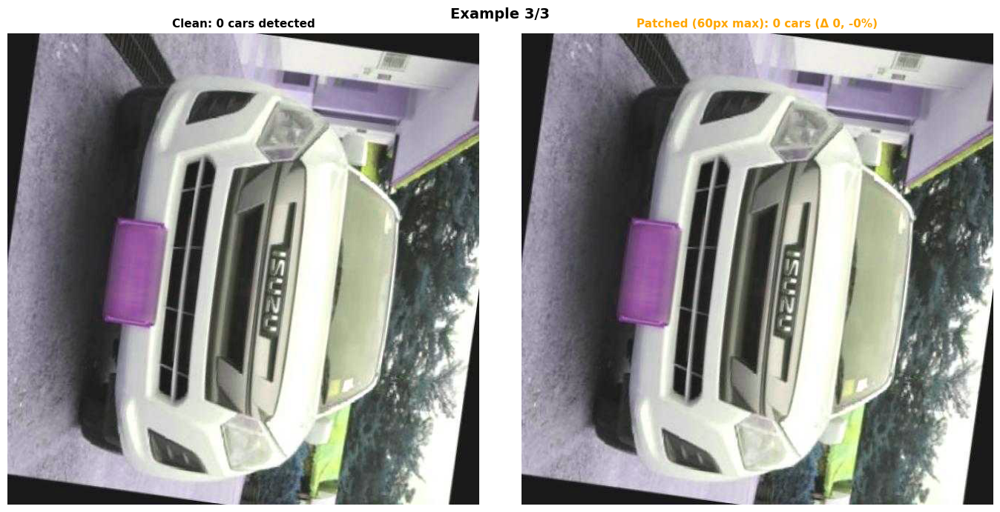

Image 3: Clean=0 → Patched=0 | Drop=0 (0.0%)

📈 Summary:
   ✅ Using 60px MAX patches
   ✅ Patches placed inside detected car bounding boxes
   ✅ Size: 8-18% of car bbox, clamped to 20-60px


In [ ]:


PATCH_DIR = Path("outputs/patches")
best_patch_path = PATCH_DIR / "best_patch.png"

if best_patch_path.exists():
    print(f"✅ Loading patch from: {best_patch_path}")
    trained_patch = Image.open(best_patch_path)
    
    model.model.eval()
    print("✅ Model set to eval mode for proper inference\n")
    
    test_images = random.sample(image_paths, min(3, len(image_paths)))
    
    for idx, img_path in enumerate(test_images):
        original_img = Image.open(img_path).convert("RGB")
        patched_img = original_img.copy().convert("RGBA")
        
        results = model.predict(source=str(img_path), conf=0.25, verbose=False, show=False, save=False, classes=[CONFIG['car_class_id']])
        
        if len(results) > 0 and len(results[0].boxes) > 0:
            car_boxes = []
            for b in results[0].boxes:
                try:
                    cls_id = int(b.cls)
                except:
                    cls_id = -1
                if cls_id == CONFIG['car_class_id']:
                    xy = [int(v.item()) for v in b.xyxy[0]]
                    img_w, img_h = original_img.size
                    car_w, car_h = xy[2] - xy[0], xy[3] - xy[1]
                    area_pct = (car_w * car_h) / (img_w * img_h) * 100
                    if area_pct >= CONFIG["min_car_area_pct"]:
                        car_boxes.append(xy)
            
            if len(car_boxes) > 0:
                x1, y1, x2, y2 = random.choice(car_boxes)
                car_w, car_h = x2 - x1, y2 - y1
                
                if car_w >= 40 and car_h >= 40:
                    scale = random.uniform(0.08, 0.18)
                    patch_w = int(car_w * scale)
                    patch_h = int(car_h * scale)
                    patch_w = max(20, min(60, patch_w))
                    patch_h = max(20, min(60, patch_h))
                    patch_w = min(patch_w, car_w - 6)
                    patch_h = min(patch_h, car_h - 6)
                    
                    if patch_w >= 20 and patch_h >= 20:
                        patch_resized = trained_patch.resize((patch_w, patch_h))
                        max_offset_x = max(0, car_w - patch_w)
                        max_offset_y = max(0, car_h - patch_h)
                        px = x1 + random.randint(0, max_offset_x)
                        py = y1 + random.randint(0, max_offset_y)
                        layer = Image.new("RGBA", patched_img.size, (0, 0, 0, 0))
                        layer.paste(patch_resized.convert("RGBA"), (px, py))
                        patched_img = Image.alpha_composite(patched_img, layer)
        
        patched_img = patched_img.convert("RGB")
        
        results_clean = model.predict(source=original_img, conf=0.25, verbose=False, classes=[CONFIG['car_class_id']])
        results_patched = model.predict(source=patched_img, conf=0.25, verbose=False, classes=[CONFIG['car_class_id']])
        
        cars_clean = sum(1 for box in results_clean[0].boxes if int(box.cls) == CONFIG["car_class_id"])
        cars_patched = sum(1 for box in results_patched[0].boxes if int(box.cls) == CONFIG["car_class_id"])
        
        img_clean_annotated = results_clean[0].plot()
        img_patched_annotated = results_patched[0].plot()
        
        fig, axes = plt.subplots(1, 2, figsize=(14, 7))
        
        axes[0].imshow(img_clean_annotated)
        axes[0].set_title(f'Clean: {cars_clean} cars detected', fontsize=11, fontweight='bold')
        axes[0].axis('off')
        
        drop = cars_clean - cars_patched
        drop_pct = (drop / max(cars_clean, 1)) * 100
        color = 'green' if drop > 0 else 'red' if drop < 0 else 'orange'
        
        axes[1].imshow(img_patched_annotated)
        axes[1].set_title(f'Patched (60px max): {cars_patched} cars (Δ {drop}, -{drop_pct:.0f}%)', 
                          fontsize=11, fontweight='bold', color=color)
        axes[1].axis('off')
        
        plt.suptitle(f"Example {idx + 1}/{len(test_images)}", fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()
        
        print(f"Image {idx + 1}: Clean={cars_clean} → Patched={cars_patched} | Drop={drop} ({drop_pct:.1f}%)")
    
    print("\n📈 Summary:")
    print(f"   ✅ Using 60px MAX patches")
    print(f"   ✅ Patches placed inside detected car bounding boxes")
    print(f"   ✅ Size: 8-18% of car bbox, clamped to 20-60px")
    
else:
    print(f"❌ No trained patch found at {best_patch_path}")
    print("   Run the training cell (Cell 7) first!")

In [ ]:

OUTPUT_DIR = Path("outputs")
PATCH_DIR = OUTPUT_DIR / "patches"
OUT_DIR = OUTPUT_DIR / "patched_dataset"
OUT_DIR.mkdir(parents=True, exist_ok=True)
best_patch = PATCH_DIR / "best_patch.png"
if best_patch.exists():
    PATCH_IMG_PATH = str(best_patch)
    print(f"🟢 Using BEST patch: {PATCH_IMG_PATH}")
else:
    patch_files = sorted(PATCH_DIR.glob("aggressive_patch_step_*.png"))
    if patch_files:
        PATCH_IMG_PATH = str(patch_files[-1])
        print(f"🟡 Using latest patch: {PATCH_IMG_PATH}")
    else:
        raise FileNotFoundError(f"❌ No patches found in {PATCH_DIR}")

patch_rgba = Image.open(PATCH_IMG_PATH).convert("RGBA")

# CRITICAL: Reset model to eval mode for proper inference
model.model.eval()
print("✅ Model set to eval mode\n")

def detect_and_patch(img_path, patch_rgba, save_path, min_scale=0.08, max_scale=0.18, max_dim=60):
    """Embed patch inside car bbox. Max size: 60px (8-18% of car bbox)"""
    img = Image.open(img_path).convert("RGBA")
    
    w, h = img.size  # Get image dimensions
    
    results = model.predict(source=str(img_path), conf=0.25, verbose=False, show=False, save=False, classes=[CONFIG['car_class_id']])
    if len(results) == 0 or len(results[0].boxes) == 0:
        return False
    
    car_boxes = []
    for b in results[0].boxes:
        try:
            cls_id = int(b.cls)
        except:
            cls_id = -1
        if cls_id == CONFIG['car_class_id']:
            xy = [int(v.item()) for v in b.xyxy[0]]
            # Filter by area (only large cars >30% of image)
            car_w, car_h = xy[2] - xy[0], xy[3] - xy[1]
            area_pct = (car_w * car_h) / (w * h) * 100
            if area_pct >= CONFIG["min_car_area_pct"]:
                car_boxes.append(xy)
    
    if len(car_boxes) == 0:
        return False
    
    x1, y1, x2, y2 = random.choice(car_boxes)
    car_w, car_h = x2 - x1, y2 - y1
    
    if car_w < 40 or car_h < 40:
        return False
    
    # Use uniform 60x60 patch size (no random scaling)
    patch_w = 60
    patch_h = 60

    # Only shrink if car is too small
    if car_w < 66:  # 60 + 6px margin
        patch_w = max(20, car_w - 6)
    if car_h < 66:  # 60 + 6px margin
        patch_h = max(20, car_h - 6)
        
    if patch_w < 20 or patch_h < 20:
        return False
    
    patch_scaled = patch_rgba.resize((patch_w, patch_h), resample=Image.BILINEAR)
    
    max_offset_x = max(0, car_w - patch_w)
    max_offset_y = max(0, car_h - patch_h)
    px = x1 + random.randint(0, max_offset_x)
    py = y1 + random.randint(0, max_offset_y)
    
    layer = Image.new("RGBA", img.size, (0, 0, 0, 0))
    layer.paste(patch_scaled, (px, py), patch_scaled)
    
    patched_img = Image.alpha_composite(img, layer).convert("RGB")
    patched_img.save(save_path, quality=95)
    return True

print(f"🧹 Clearing {OUT_DIR}...")
import shutil
if OUT_DIR.exists():
    shutil.rmtree(OUT_DIR)
OUT_DIR.mkdir(parents=True, exist_ok=True)

unique_images = {}
for img_path in image_paths:
    if "outputs" not in str(img_path) and "patched_dataset" not in str(img_path):
        name = img_path.name
        if name not in unique_images:
            unique_images[name] = img_path

print(f"Found {len(unique_images)} unique SOURCE images\n")
print(f"🧩 Embedding patches (MAX 60px)...")

success_count = 0
skipped_count = 0

for name, img_path in tqdm(unique_images.items(), desc="Processing"):
    save_path = OUT_DIR / name
    if detect_and_patch(img_path, patch_rgba, save_path):
        success_count += 1
    else:
        skipped_count += 1

print(f"\n✅ Done!")
print(f"   {skipped_count} skipped")

🟢 Using BEST patch: outputs/patches/best_patch.png
✅ Model set to eval mode

🧹 Clearing outputs/patched_dataset...
Found 3833 unique SOURCE images

🧩 Embedding patches (MAX 60px)...


Processing:   0%|▏                                                                    | 11/3833 [00:00<01:18, 48.53it/s]

Processing: 100%|███████████████████████████████████████████████████████████████████| 3833/3833 [01:10<00:00, 54.22it/s]


✅ Done!
   2954 skipped


In [ ]:

# Use relative paths (writable in apptainer)
CLEAN_DIR = Path(CONFIG["data_root"])  # Original dataset (carparts-seg)
PATCHED_DIR = Path("outputs/patched_dataset")  # Patched dataset
OUTPUT_DIR = Path("outputs")

patched_imgs = sorted(list(PATCHED_DIR.rglob("*.jpg"))) + sorted(list(PATCHED_DIR.rglob("*.png")))
print(f"Found {len(patched_imgs)} patched images in {PATCHED_DIR}")

# CRITICAL: Reset model to eval mode for proper inference
model.model.eval()
print("✅ Model set to eval mode\n")

def count_car_detections(img_path):
    from PIL import Image
    img = Image.open(img_path)
    img_w, img_h = img.size
    
    results = model.predict(
        source=str(img_path), conf=0.25, verbose=False,
        show=False, save=False, save_txt=False, save_crop=False,
        classes=[CONFIG['car_class_id']]
    )
    
    count = 0
    for r in results:
        for box in r.boxes:
            if int(box.cls) == CONFIG["car_class_id"]:
                xy = box.xyxy[0]
                car_w = float(xy[2] - xy[0])
                car_h = float(xy[3] - xy[1])
                area_pct = (car_w * car_h) / (img_w * img_h) * 100
                if area_pct >= CONFIG["min_car_area_pct"]:
                    count += 1
    return count

# --- Main loop ---
clean_counts, patched_counts, names = [], [], []

print("\nRunning detection on clean + patched pairs (silent mode)...")
for patched_path in tqdm(patched_imgs):
    name = Path(patched_path).name
    clean_path = next(CLEAN_DIR.rglob(name), None)
    if not clean_path:
        continue
    clean_counts.append(count_car_detections(clean_path))
    patched_counts.append(count_car_detections(patched_path))
    names.append(name)

# --- Results dataframe ---
df = pd.DataFrame({
    "image": names,
    "cars_clean": clean_counts,
    "cars_patched": patched_counts
})
df["drop_%"] = (1 - (df["cars_patched"] / (df["cars_clean"] + 1e-6))) * 100
csv_path = OUTPUT_DIR / "patch_effect_stats_full.csv"
df.to_csv(csv_path, index=False)

# --- Summary ---
mean_clean = df["cars_clean"].mean()
mean_patched = df["cars_patched"].mean()
drop_mean = df["drop_%"].mean()

print("\n📊 Results Summary (1-to-1, completely silent)")
print(f"  Avg cars detected (clean):   {mean_clean:.2f}")
print(f"  Avg cars detected (patched): {mean_patched:.2f}")
print(f"  🔻 Average drop: {drop_mean:.1f}%")
print(f"  CSV saved to: {csv_path}")


Found 879 patched images in outputs/patched_dataset
✅ Model set to eval mode


Running detection on clean + patched pairs (silent mode)...
Found 879 patched images in outputs/patched_dataset
✅ Model set to eval mode


Running detection on clean + patched pairs (silent mode)...


100%|█████████████████████████████████████████████████████████████████████████████████| 879/879 [00:21<00:00, 41.34it/s]


📊 Results Summary (1-to-1, completely silent)
  Avg cars detected (clean):   1.01
  Avg cars detected (patched): 0.83
  🔻 Average drop: 17.7%
  CSV saved to: outputs/patch_effect_stats_full.csv


✅ Model set to eval mode

🎯 Selecting examples across drop % ranges:

✓ 0% drop (no effect)       Found 718 images, selected 2
✗ 1-33% drop (low)          No images in this range
✓ 34-66% drop (medium)      Found 1 images, selected 1
✗ 67-99% drop (high)        No images in this range
✓ 100% drop (perfect)       Found 157 images, selected 2

Displaying 5 examples:

1. te66_jpg.rf.8ab825e9974fe94045f783f08befeb3d.jpg   Clean: 1 → Patched: 1 (drop: 0.0%)
2. train241_jpg.rf.e34cf3cdd885d76040880be1b927d613.jpg Clean: 1 → Patched: 1 (drop: 0.0%)
3. train231_jpg.rf.ef62a7d9414eb75db8b59436e85d329f.jpg Clean: 2 → Patched: 1 (drop: 50.0%)
4. train378_jpg.rf.6632501e3f0cc46d3d9394d66600ee19.jpg Clean: 1 → Patched: 0 (drop: 100.0%)
5. train100_jpg.rf.1022a8c683b948c4fdca89b4806fa7df.jpg Clean: 1 → Patched: 0 (drop: 100.0%)




/tmp/ipykernel_334314/1204719010.py:126: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_334314/1204719010.py:126: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/opt/conda/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/conda/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


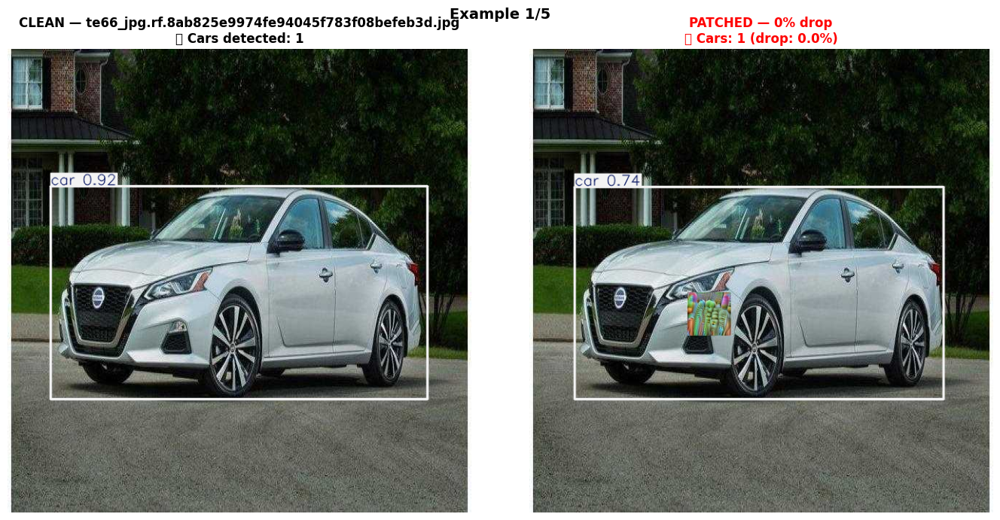

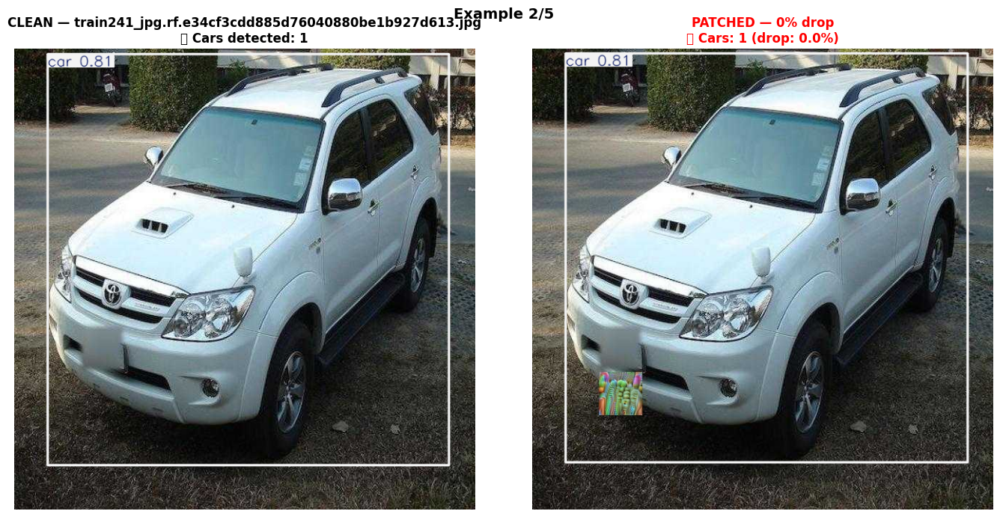

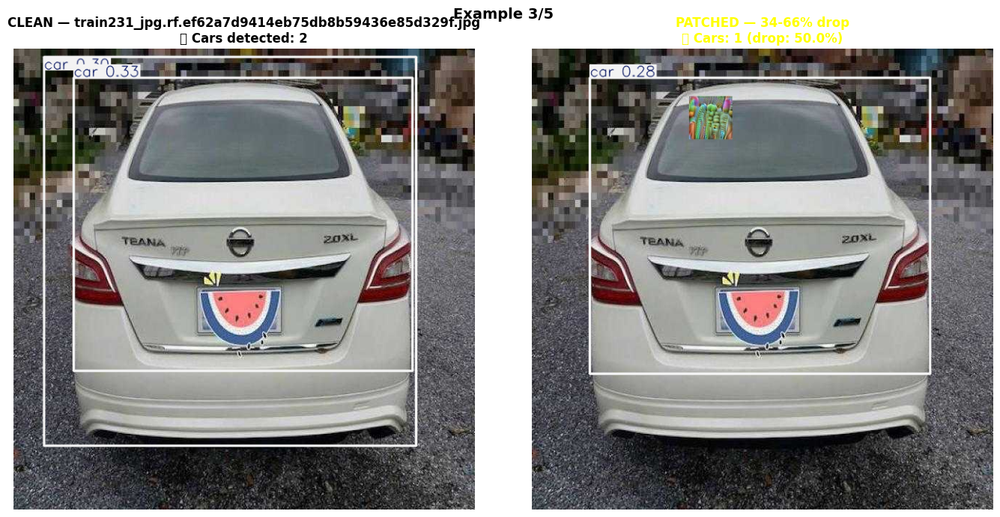

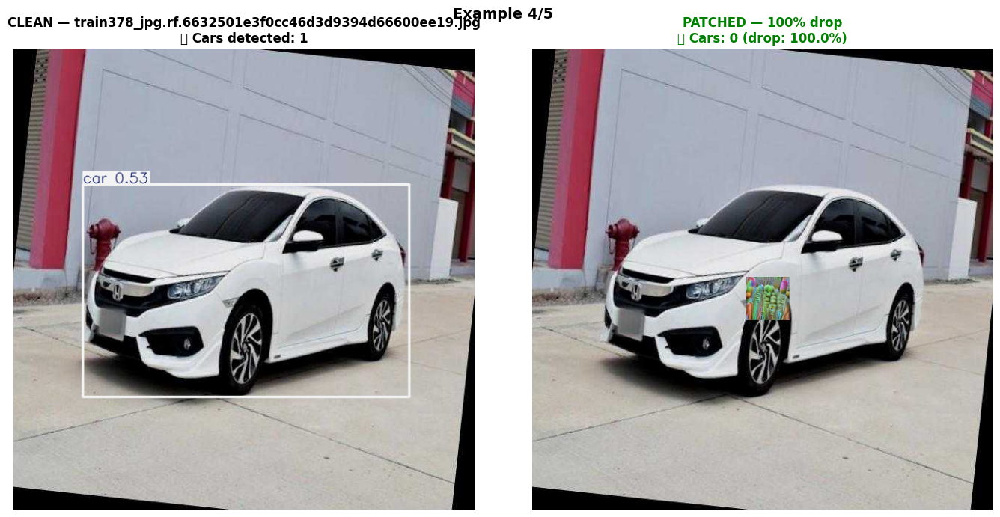

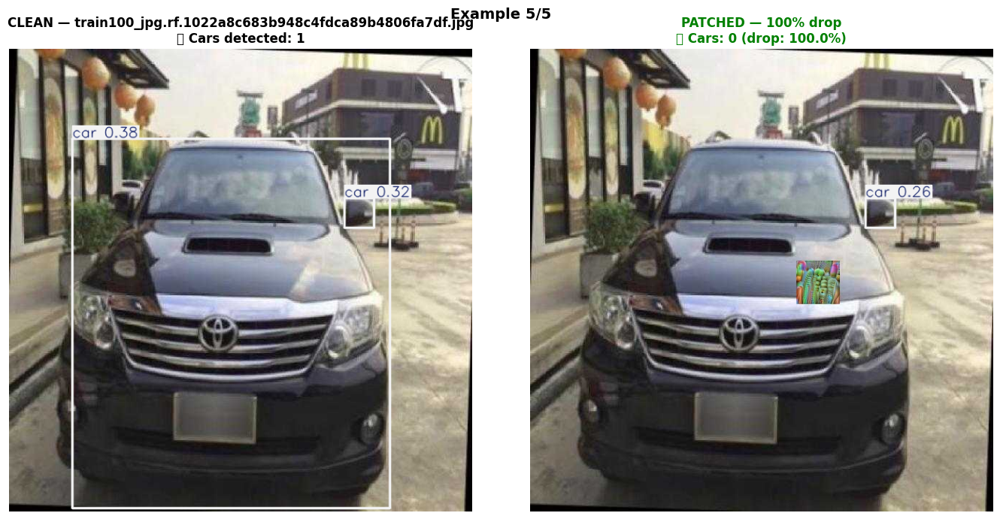


📊 Summary of 5 examples across drop ranges:
   Avg drop: 50.0%
   Max drop: 100.0%
   Min drop: 0.0%

   Distribution by range:
   • 0% drop (no effect)       2 examples
   • 34-66% drop (medium)      1 examples
   • 100% drop (perfect)       2 examples


In [ ]:

# Use relative paths
OUTPUT_DIR = Path("outputs")
csv_path = OUTPUT_DIR / "patch_effect_stats_full.csv"
df = pd.read_csv(csv_path)

# Compute drop percent
df["drop_%"] = (1 - (df["cars_patched"] / (df["cars_clean"] + 1e-6))) * 100

# CRITICAL: Reset model to eval mode for proper inference
model.model.eval()
print("✅ Model set to eval mode\n")

# ==== SELECT EXAMPLES ACROSS DROP % RANGES ====
# Define ranges: 0%, 1-33%, 34-66%, 67-99%, 100%
ranges = {
    "0% drop (no effect)": (0, 0.1),
    "1-33% drop (low)": (1, 33),
    "34-66% drop (medium)": (34, 66),
    "67-99% drop (high)": (67, 99),
    "100% drop (perfect)": (99.9, 100.1)
}

selected_examples = []
examples_per_range = 2  # Show 2 examples per range

print("🎯 Selecting examples across drop % ranges:\n")
print("="*70)

for range_name, (min_drop, max_drop) in ranges.items():
    # Filter dataframe for this range
    range_df = df[(df["drop_%"] >= min_drop) & (df["drop_%"] <= max_drop)]
    
    if len(range_df) > 0:
        # Take up to 2 examples from this range
        samples = range_df.sample(n=min(examples_per_range, len(range_df)), random_state=42)
        selected_examples.append(samples)
        print(f"✓ {range_name:<25} Found {len(range_df)} images, selected {len(samples)}")
    else:
        print(f"✗ {range_name:<25} No images in this range")

print("="*70 + "\n")

# Combine all selected examples
if selected_examples:
    all_examples = pd.concat(selected_examples, ignore_index=True)
else:
    print("❌ No examples found in any range!")
    all_examples = df.sample(n=min(10, len(df)), random_state=42)

print(f"Displaying {len(all_examples)} examples:\n")
for idx, row in all_examples.iterrows():
    print(f"{idx+1}. {row['image']:<50} Clean: {row['cars_clean']} → Patched: {row['cars_patched']} (drop: {row['drop_%']:.1f}%)")
print("\n")

def detect_and_draw(img_path):
    from PIL import Image as PILImage
    import numpy as np
    results = model.predict(
        source=str(img_path),
        conf=0.25,
        verbose=False,
        show=False,
        save=False,
        save_txt=False,
        save_crop=False,
        classes=[CONFIG['car_class_id']]
    )
    rendered = results[0].plot()
    return cv2.cvtColor(rendered, cv2.COLOR_BGR2RGB)

# Use relative paths
CLEAN_DIR = Path(CONFIG["data_root"])  # Original dataset
PATCHED_DIR = Path("outputs/patched_dataset")  # Patched dataset

# Display each example
for idx, row in all_examples.iterrows():
    name = row["image"]
    clean_path = next(CLEAN_DIR.rglob(name))
    patched_path = PATCHED_DIR / name

    img_clean = detect_and_draw(clean_path)
    img_patch = detect_and_draw(patched_path)

    # Plot side by side
    fig, ax = plt.subplots(1, 2, figsize=(14, 7))
    
    # Clean image
    ax[0].imshow(img_clean)
    ax[0].set_title(f"CLEAN — {name}\n✅ Cars detected: {int(row['cars_clean'])}", 
                    fontsize=12, fontweight='bold')
    ax[0].axis("off")

    # Patched image
    drop_pct = row['drop_%']
    
    # Determine category and color
    if drop_pct <= 0.1:
        category = "0% drop"
        color = 'red'
    elif drop_pct <= 33:
        category = "1-33% drop"
        color = 'orange'
    elif drop_pct <= 66:
        category = "34-66% drop"
        color = 'yellow'
    elif drop_pct <= 99:
        category = "67-99% drop"
        color = 'lightgreen'
    else:
        category = "100% drop"
        color = 'green'
    
    ax[1].imshow(img_patch)
    ax[1].set_title(f"PATCHED — {category}\n🎯 Cars: {int(row['cars_patched'])} (drop: {drop_pct:.1f}%)", 
                    fontsize=12, fontweight='bold', color=color)
    ax[1].axis("off")

    plt.suptitle(f"Example {idx+1}/{len(all_examples)}", fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Final summary
print("\n" + "="*70)
print(f"📊 Summary of {len(all_examples)} examples across drop ranges:")
print(f"   Avg drop: {all_examples['drop_%'].mean():.1f}%")
print(f"   Max drop: {all_examples['drop_%'].max():.1f}%")
print(f"   Min drop: {all_examples['drop_%'].min():.1f}%")
print("\n   Distribution by range:")
for range_name, (min_drop, max_drop) in ranges.items():
    count = len(all_examples[(all_examples["drop_%"] >= min_drop) & (all_examples["drop_%"] <= max_drop)])
    if count > 0:

        print(f"   • {range_name:<25} {count} examples")
        print("="*70)